<a href="https://colab.research.google.com/github/sathasivamn/Project-602-Resume-Classification-Fnl/blob/main/Project_602%E2%80%93Resume_Classification_Fnl.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project 602– Resume Classification

## Data loading
## Cleaning
## Category distribution
## Resume length analytics
## WordClouds
## N-grams
## TF-IDF features
## Category-wise word analysis
## Correlation



# 1. Install & Import Dependencies


In [57]:
!pip install nltk wordcloud matplotlib seaborn scikit-learn pandas numpy python-docx PyPDF2 --quiet

In [58]:
# Basic libraries
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# NLP
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Text cleaning
import re
import string

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

# 2. Load the Dataset


In [59]:
from google.colab import files
import io
import zipfile
import docx
from PyPDF2 import PdfReader
import pandas as pd
import os
import sys
from collections import Counter

uploaded = files.upload()

# helper readers
def read_docx_from_bytes(file_bytes):
    # Read .docx using python-docx
    doc = docx.Document(io.BytesIO(file_bytes))
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return '\n'.join(full_text)

def read_pdf_from_bytes(file_bytes):
    reader = PdfReader(io.BytesIO(file_bytes))
    full_text = []
    for page in reader.pages:
        # extract_text can return None
        text = page.extract_text()
        full_text.append(text if text else '')
    return '\n'.join(full_text)

# Get uploaded zip (assumes only one file uploaded)
zip_file_name = list(uploaded.keys())[0]
zip_content = uploaded[zip_file_name]

resume_data = []
errors = []

with zipfile.ZipFile(io.BytesIO(zip_content), 'r') as z:
    # Iterate through every member in the zip (handles nested folders)
    for member in z.namelist():
        # Normalize path (windows zips may have backslashes)
        member_norm = member.replace('\\', '/')

        # Skip directories and macOS resource forks
        if member_norm.endswith('/') or member_norm.startswith('__MACOSX/') or os.path.basename(member_norm).startswith('.'):
            continue

        filename_only = os.path.basename(member_norm)
        # determine parent folder if any
        path_parts = member_norm.split('/')
        parent_folder = path_parts[-2] if len(path_parts) > 1 else None

        # Derive label:
        # Priority: (1) text before underscore in filename, (2) parent folder name, (3) 'Unknown'
        parts = filename_only.split('_')
        if len(parts) > 1 and parts[0].strip():
            label = parts[0].strip()
        elif parent_folder:
            label = parent_folder.strip()
        else:
            # try removing extension
            label = os.path.splitext(filename_only)[0]

        # Clean label from extension accident
        label = label.replace('.pdf','').replace('.docx','').replace('.doc','').strip()

        try:
            with z.open(member) as file:
                file_bytes = file.read()
                text_content = ""
                fname_lower = filename_only.lower()

                if fname_lower.endswith('.docx'):
                    text_content = read_docx_from_bytes(file_bytes)
                elif fname_lower.endswith('.pdf'):
                    text_content = read_pdf_from_bytes(file_bytes)
                elif fname_lower.endswith('.doc'):
                    # python-docx doesn't support .doc (MS Word 97-2003).
                    # We attempt a naive fallback: try to decode bytes as cp1252/latin1/utf-8
                    # but recommend converting .doc -> .docx beforehand for reliable parsing.
                    try:
                        text_content = file_bytes.decode('utf-8', errors='ignore')
                    except Exception as e:
                        text_content = ""
                        errors.append((member_norm, f".doc decode failed: {e}"))
                else:
                    # Unsupported file type — skip but note it
                    errors.append((member_norm, "Unsupported extension; skipped"))
                    continue

                # Minimal whitespace normalization
                text_content = " ".join(text_content.split())
                if not text_content:
                    errors.append((member_norm, "Empty text after extraction"))

                resume_data.append({
                    'zip_member_path': member_norm,
                    'filename': filename_only,
                    'label': label,
                    'text': text_content
                })
        except Exception as e:
            errors.append((member_norm, str(e)))
            continue

# Create DataFrame
df = pd.DataFrame(resume_data)
print(f"Loaded {len(df)} resumes into DataFrame.")

# quick diagnostics
if not df.empty:
    print("\nSample rows:")
    display(df.head())

# show label counts
label_counts = Counter(df['label'])
print("\nResume counts by label (top 20):")
for lbl, cnt in label_counts.most_common(20):
    print(f"{lbl}: {cnt}")

# show errors (if any)
if errors:
    print(f"\nEncountered {len(errors)} issues while processing the zip. Examples:")
    for e in errors[:10]:
        print(" -", e)
    print("\nNote: .doc files are fragile to parse. If you have many .doc files, convert them to .docx or install a tool like `textract` or `antiword` (may need extra system packages).")

Saving Data set.zip to Data set (2).zip
Loaded 79 resumes into DataFrame.

Sample rows:


,zip_member_path,filename,label,text
0,Resumes/React Developer_Haripriya.docx,React Developer_Haripriya.docx,React Developer,HARIPRIYA BATTINA Experience as UI Developer i...
1,Resumes/React Developer_Naveen sadhu.docx,React Developer_Naveen sadhu.docx,React Developer,Naveen Sadhu Title: software developer Locatio...
2,Resumes/Reactjs Developer_MD Khizaruddin Rauf ...,Reactjs Developer_MD Khizaruddin Rauf _Musquar...,Reactjs Developer,MD KHIZARUDDIN RAUF EXPERIENCE ⇨ Currently wor...
3,Resumes/Internship_Susovan Bag_Musquare Techno...,Internship_Susovan Bag_Musquare Technologies.docx,Internship,SUSOVAN BAG Seeking a challenging position in ...
4,Resumes/Internship_Ravali_Musquare Technologie...,Internship_Ravali_Musquare Technologies (1).docx,Internship,Name: Ravali P Curriculum Vitae Specialization...



Resume counts by label (top 20):
SQL Developer Lightning insight: 10
React Developer: 9
Peoplesoft Admin: 9
Reactjs Developer: 8
Peoplesoft FSCM: 5
React JS Developer: 3
Peoplesoft Finance: 3
Internship: 2
React Dev: 2
PeopleSoft DBA: 2
Rajupavanakumari[2: 1
Resume: 1
RameshNataru[3: 1
PSyamKumar[2: 1
SSKumar: 1
P V Sai Krishna: 1
Jyotiverma: 1
Hari Krishna M: 1
J. Sumanth Royal: 1
ShireeshKumar: 1


# 3. Basic Dataset Information


In [60]:
df.info()
df.describe(include='all')
df.isnull().sum()
df.duplicated().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79 entries, 0 to 78
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   zip_member_path  79 non-null     object
 1   filename         79 non-null     object
 2   label            79 non-null     object
 3   text             79 non-null     object
dtypes: object(4)
memory usage: 2.6+ KB


np.int64(0)

# 4. Sample Rows & Data Understanding


In [61]:
print("Sample Resumes:\n")
for i in range(3):
    print(f"----- Resume {i+1} -----")
    print(df['text'][i][:800], "\n")

Sample Resumes:

----- Resume 1 -----
HARIPRIYA BATTINA Experience as UI Developer in Reactjs, JavaScript. Phone: +91 9908576950 Gmail: haripriyabattini@gmai.com Location: Visakhapatnam JOB OBJECTIVE ● Looking for a challenging role to put my experience in various aspects of technology with an objective to be a leading source of information and guidance concerning th technological requirements. ● Want to be a part of a reputed organization that allows me to effectively use my technical skills in the real world for overall growth of organization and my professional career. WORK EXPERIENCE EDUCATION 1. Associate UI Developr Company: Blue Yonder, Hyderabad. ● Work Done On “COPERNICUS” Project. ● The Main Moto of this project is, it is GTM (Go To Market) Portal which is specially designed for demo teams to shower case Blue Yonder  

----- Resume 2 -----
Naveen Sadhu Title: software developer Location: Hyderabad, India Professional Summary 1 year of overall IT experience in Html, Sql, React

# 5. Clean the Resume Text


In [62]:
## Define a cleaner function:
stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Lowercasing
    text = text.lower()
    # Remove URLs
    text = re.sub(r'http\S+|www.\S+', '', text)
    # Remove punctuation
    text = text.translate(str.maketrans("", "", string.punctuation))
    # Remove numbers
    text = re.sub(r'\d+', '', text)
    # Tokenize
    tokens = word_tokenize(text)
    # Remove stopwords
    tokens = [word for word in tokens if word not in stop_words]
    # Join tokens back
    return " ".join(tokens)
df['cleaned_resume'] = df['text'].apply(clean_text)
df.head()

,zip_member_path,filename,label,text,cleaned_resume
0,Resumes/React Developer_Haripriya.docx,React Developer_Haripriya.docx,React Developer,HARIPRIYA BATTINA Experience as UI Developer i...,haripriya battina experience ui developer reac...
1,Resumes/React Developer_Naveen sadhu.docx,React Developer_Naveen sadhu.docx,React Developer,Naveen Sadhu Title: software developer Locatio...,naveen sadhu title software developer location...
2,Resumes/Reactjs Developer_MD Khizaruddin Rauf ...,Reactjs Developer_MD Khizaruddin Rauf _Musquar...,Reactjs Developer,MD KHIZARUDDIN RAUF EXPERIENCE ⇨ Currently wor...,md khizaruddin rauf experience ⇨ currently wor...
3,Resumes/Internship_Susovan Bag_Musquare Techno...,Internship_Susovan Bag_Musquare Technologies.docx,Internship,SUSOVAN BAG Seeking a challenging position in ...,susovan bag seeking challenging position field...
4,Resumes/Internship_Ravali_Musquare Technologie...,Internship_Ravali_Musquare Technologies (1).docx,Internship,Name: Ravali P Curriculum Vitae Specialization...,name ravali p curriculum vitae specialization ...


# 6. Distribution of Categories



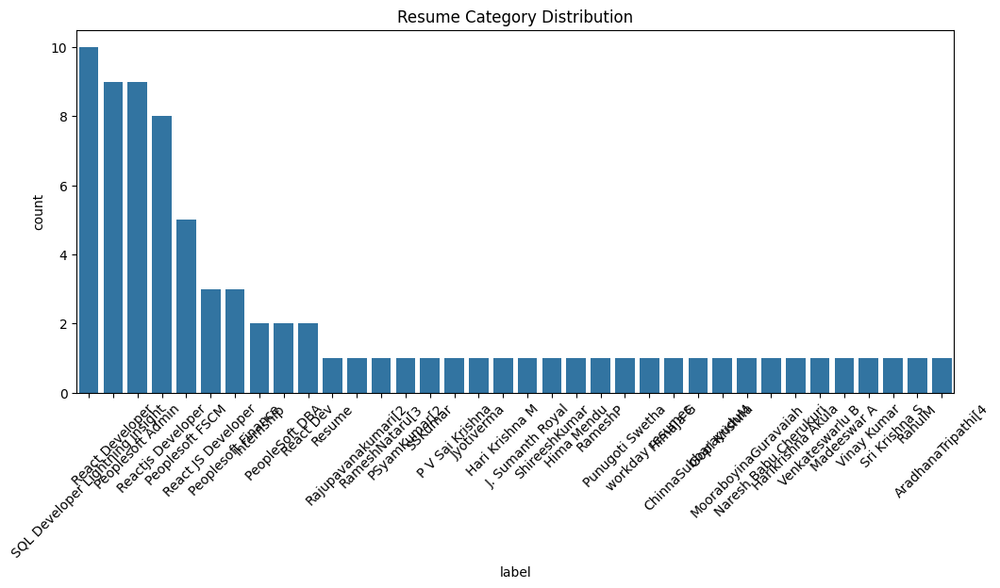

In [63]:
plt.figure(figsize=(12,5))
sns.countplot(data=df, x='label', order=df['label'].value_counts().index)
plt.xticks(rotation=45)
plt.title("Resume Category Distribution")
plt.show()

# 7. Text Length Analysis


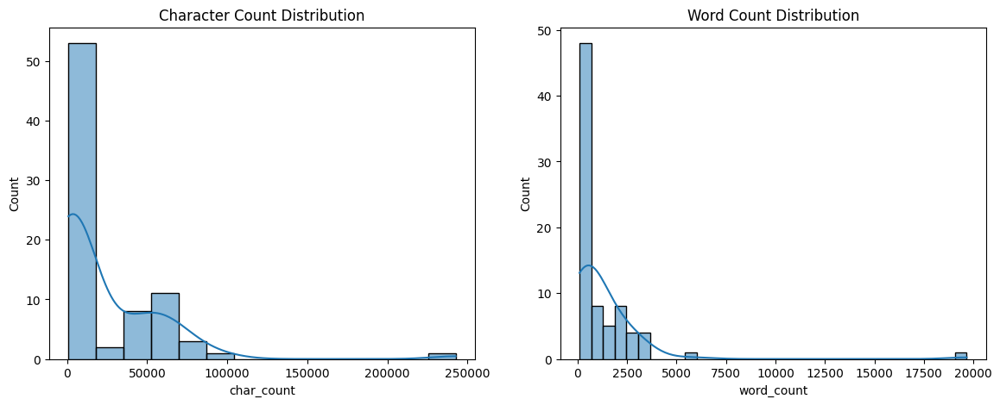

In [64]:
df['char_count'] = df['cleaned_resume'].apply(len)
df['word_count'] = df['cleaned_resume'].apply(lambda x: len(x.split()))

fig, ax = plt.subplots(1, 2, figsize=(14,5))
sns.histplot(df['char_count'], kde=True, ax=ax[0])
ax[0].set_title("Character Count Distribution")

sns.histplot(df['word_count'], kde=True, ax=ax[1])
ax[1].set_title("Word Count Distribution")
plt.show()

# 8. Category-wise Word Count Distribution


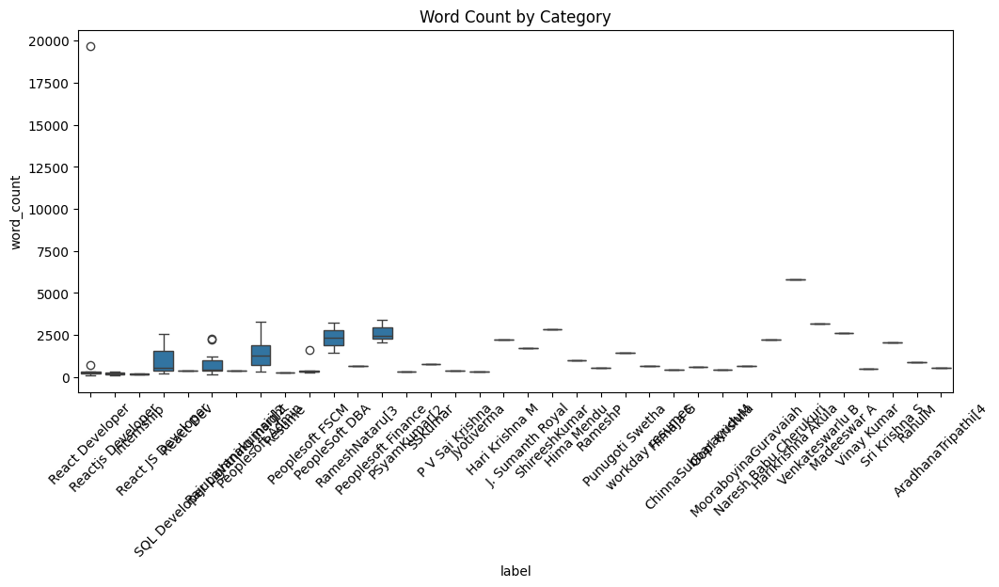

In [65]:
plt.figure(figsize=(12,5))
sns.boxplot(data=df, x='label', y='word_count')
plt.xticks(rotation=45)
plt.title("Word Count by Category")
plt.show()

# 9. WordCloud for All Resumes



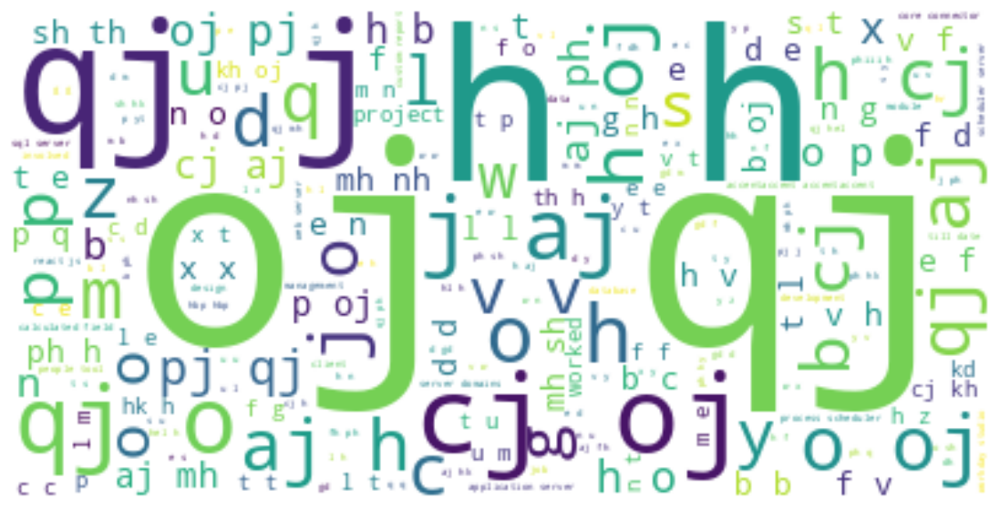

In [66]:
text = " ".join(df['cleaned_resume'])

plt.figure(figsize=(14,7))
wc = WordCloud(background_color="white", max_words=2000)
wc.generate(text)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

# 10. WordCloud Category-wise



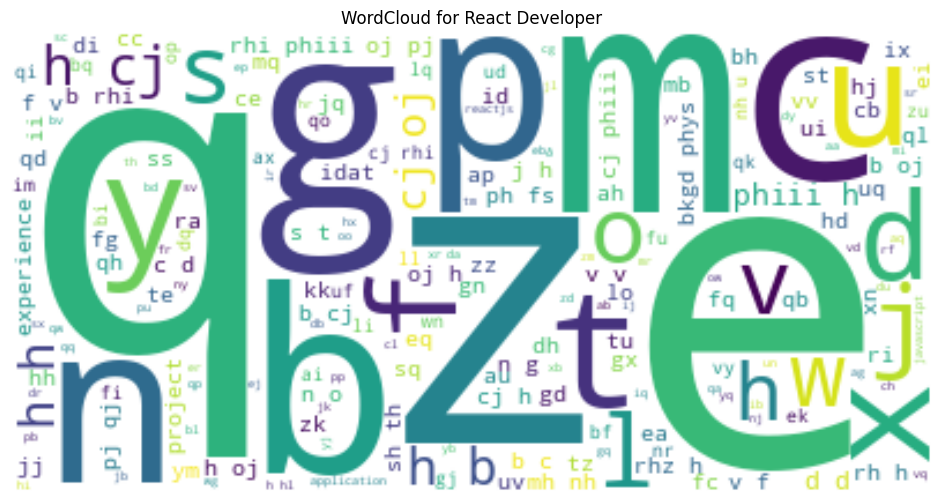

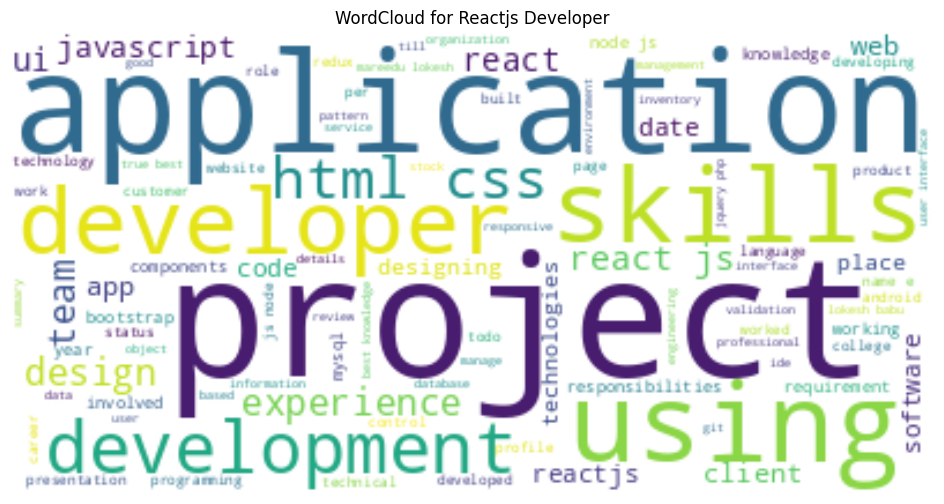

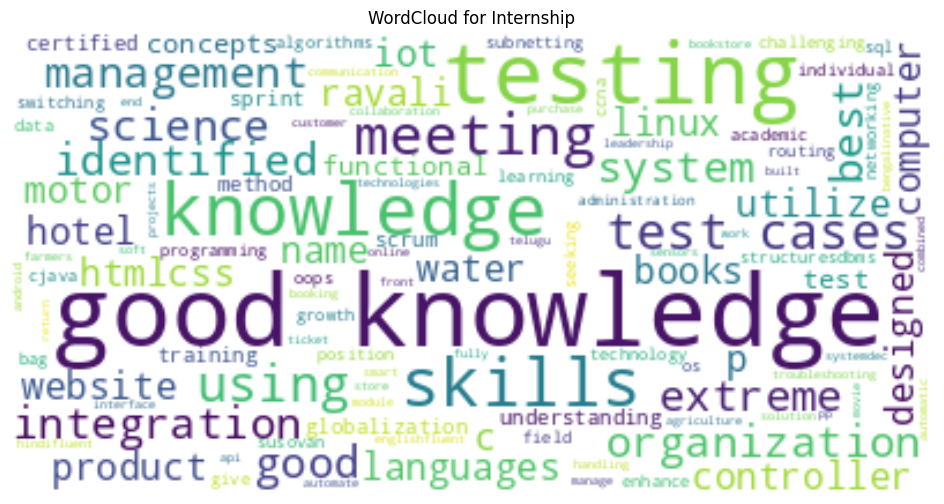

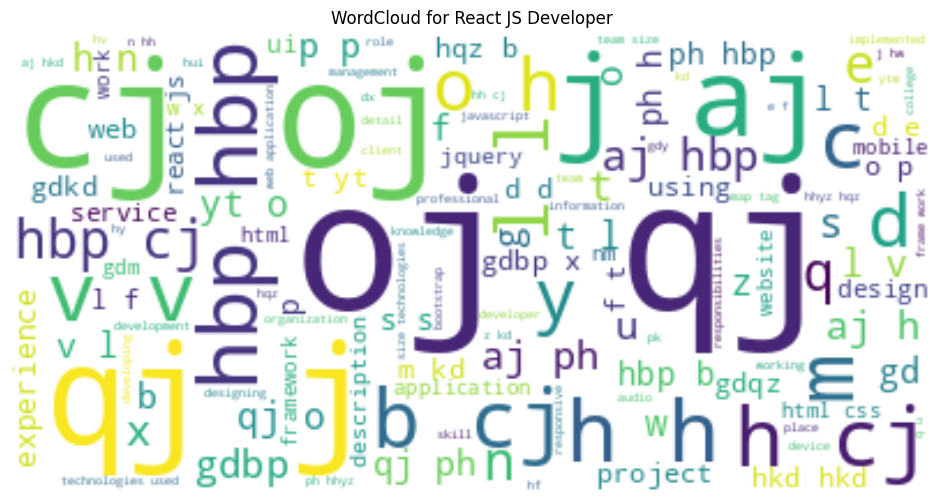

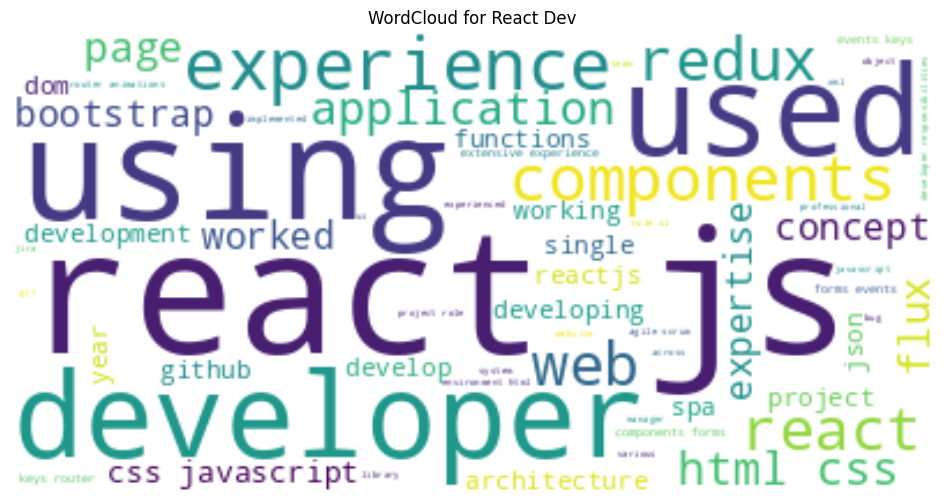

...

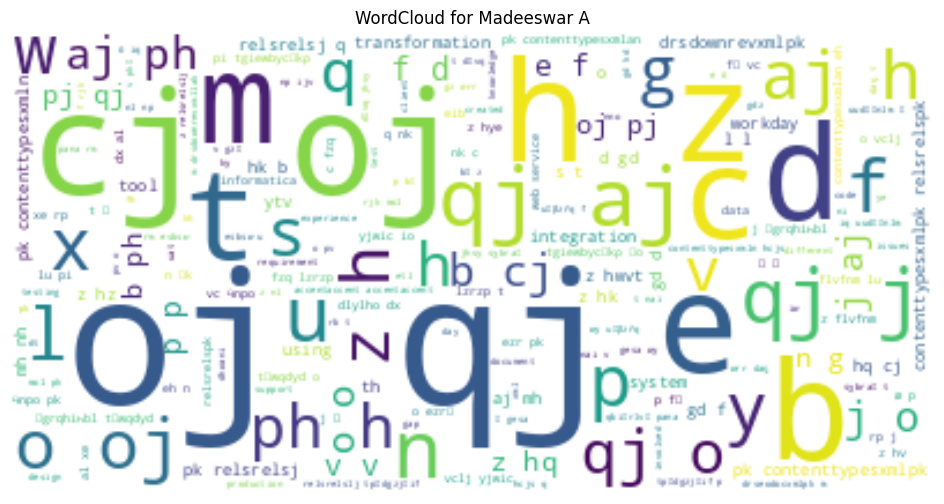

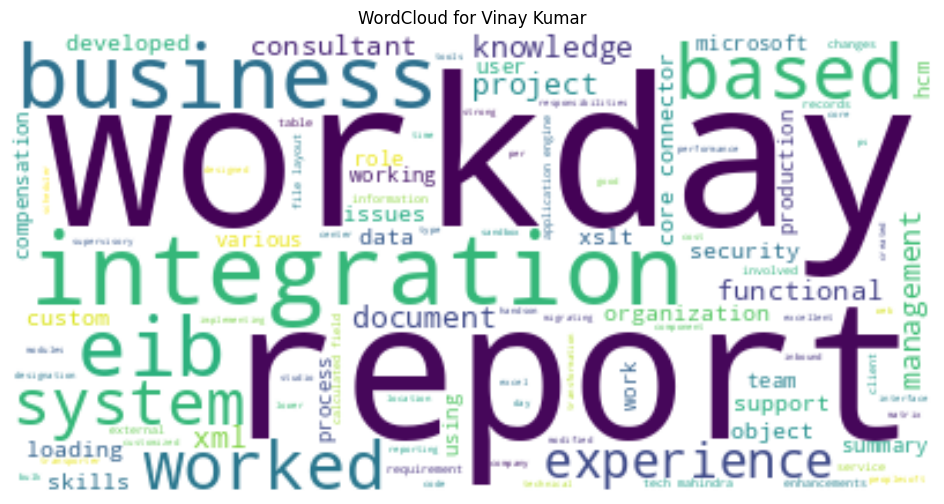

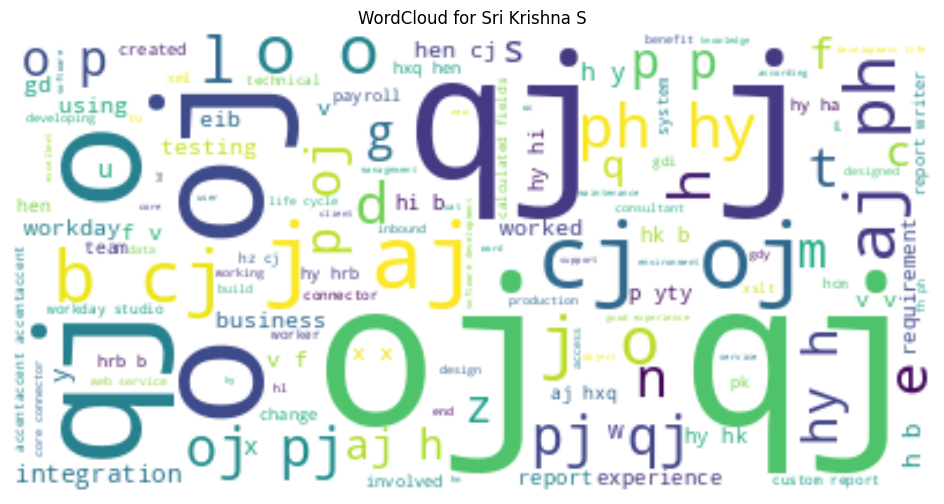

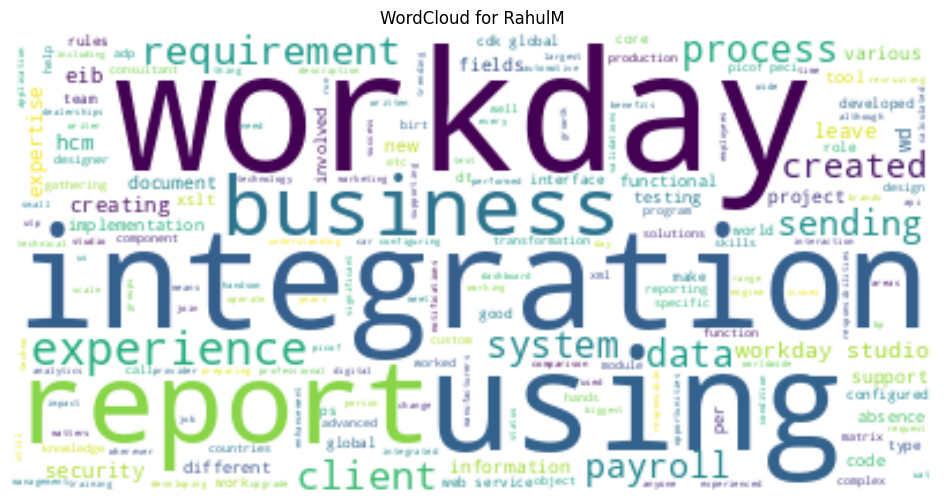

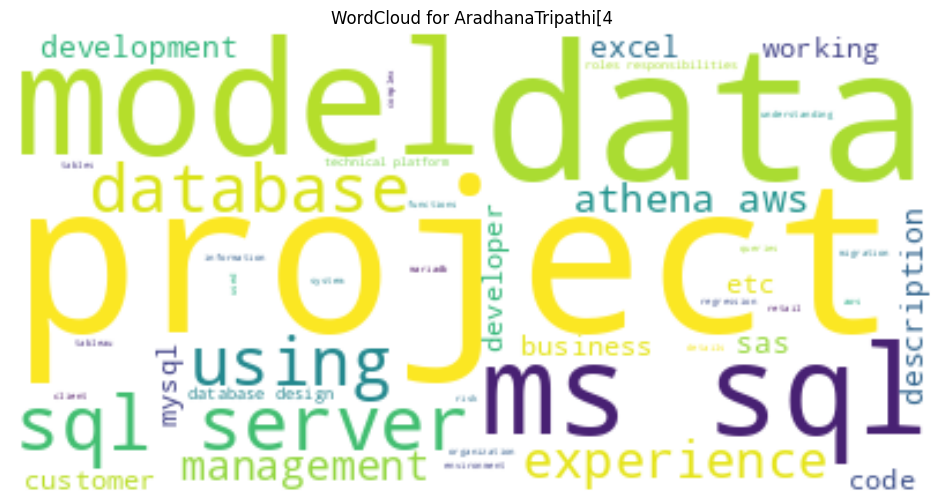

In [67]:
categories = df['label'].unique()

for cat in categories:
    subset = df[df['label'] == cat]
    text = " ".join(subset['cleaned_resume'])

    plt.figure(figsize=(12,6))
    wc = WordCloud(background_color="white", max_words=200)
    wc.generate(text)

    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud for {cat}")
    plt.show()

# 11. Most Common Words (Unigrams)



In [68]:
cv = CountVectorizer(stop_words='english', max_features=20)
unigrams = cv.fit_transform(df['cleaned_resume'])
unigram_df = pd.DataFrame(cv.get_feature_names_out(), columns=["Unigram"])

unigram_df

,Unigram
0,aj
1,application
2,cj
3,data
4,experience
5,gd
6,hk
7,mh
8,oj
9,peoplesoft


# 12. N-grams (Bigrams & Trigrams)




In [69]:
# Bigrams:

bigram_vectorizer = CountVectorizer(ngram_range=(2,2), stop_words="english", max_features=20)
bigram = bigram_vectorizer.fit_transform(df['cleaned_resume'])
pd.DataFrame(bigram_vectorizer.get_feature_names_out(), columns=['Bigram'])

,Bigram
0,aj cj
1,aj mh
2,aj ph
3,cj aj
4,cj oj
5,gd gd
6,hk cj
7,kh oj
8,mh nh
9,mh sh


In [70]:
# Trigrams:

trigram_vectorizer = CountVectorizer(ngram_range=(3,3), stop_words="english", max_features=20)
trigram = trigram_vectorizer.fit_transform(df['cleaned_resume'])
pd.DataFrame(trigram_vectorizer.get_feature_names_out(), columns=['Trigram'])

,Trigram
0,aj cj aj
1,aj cj oj
2,aj mh sh
3,cj aj cj
4,cj oj pj
5,cj oj qj
6,gd gd gd
7,hk cj oj
8,oj pj qj
9,oj qj aj


# 13. TF-IDF Vectorization (Term Frequency – Inverse Document Frequency) (Top features preview)





In [71]:
tfidf = TfidfVectorizer(max_features=50, stop_words='english')
tfidf_matrix = tfidf.fit_transform(df['cleaned_resume'])

feature_names = tfidf.get_feature_names_out()
pd.DataFrame(feature_names, columns=['Important Words'])

,Important Words
0,accentaccent
1,aj
2,application
3,business
4,cj
5,client
6,creating
7,data
8,database
9,development


# 14. Category-wise Most Frequent Words



In [72]:
def most_common_words(category, n=15):
    subset = df[df['label'] == category]
    cv = CountVectorizer(stop_words='english')
    X = cv.fit_transform(subset['cleaned_resume'])
    word_sum = np.array(X.sum(axis=0)).flatten()
    vocab = cv.get_feature_names_out()
    freq_df = pd.DataFrame({'word': vocab, 'count': word_sum})
    return freq_df.sort_values('count', ascending=False).head(n)

for cat in categories:
    print("\n\nCategory:", cat)
    print(most_common_words(cat))



Category: React Developer
             word  count
1714           cj    187
10243          oj    158
10830       phiii     78
11505          qj     61
12173         rhi     59
10861          pj     57
10820          ph     53
12164          rh     48
4364           fs     44
8893           mh     42
9622           nh     40
12187         rhz     35
3727   experience     35
13567          th     35
5444           hh     32


Category: Reactjs Developer
            word  count
439        react     27
274           js     23
566        using     19
182   experience     18
530         team     18
425      project     18
232         html     17
499       skills     17
114          css     17
144    developer     15
146  development     15
29   application     14
555           ui     13
136       design     12
281    knowledge     11


Category: Internship
             word  count
106     knowledge     24
85           good     19
190       testing     12
164        skills      7
189       

# 15. Correlation Heatmap for Numerical Features


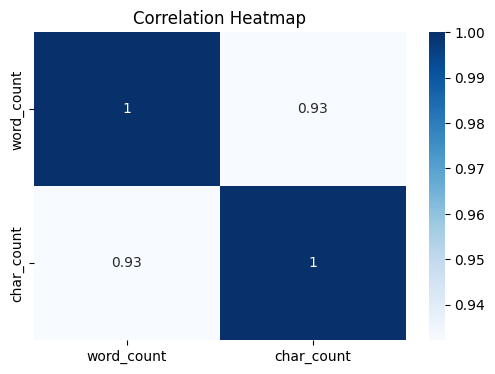

In [73]:
plt.figure(figsize=(6,4))
sns.heatmap(df[['word_count', 'char_count']].corr(), annot=True, cmap='Blues')
plt.title("Correlation Heatmap")
plt.show()

# Model Building, Evaluation, and Deployment

In [74]:
# Install Python libraries
!pip install python-docx
!pip install PyPDF2
!pip install textract
!pip install joblib scikit-learn matplotlib pandas

  Using cached textract-1.6.5-py3-none-any.whl.metadata (2.5 kB)
Requested textract from https://files.pythonhosted.org/packages/6b/3e/ac16b6bf28edf78296aea7d0cb416b49ed30282ac8c711662541015ee6f3/textract-1.6.5-py3-none-any.whl has invalid metadata: .* suffix can only be used with `==` or `!=` operators
    extract-msg (<=0.29.*)
                 ~~~~~~~^
Please use pip<24.1 if you need to use this version.
  Using cached textract-1.6.4.tar.gz (17 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [75]:
# Required for textract to read .doc files
!apt-get update -y
!apt-get install -y antiword unrtf poppler-utils tesseract-ocr libreoffice

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://cli.github.com/packages stable InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 Packages [39.2 kB]
Fetched 57.2 kB in 2s (36.0 kB/s)
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' 

In [76]:
from google.colab import drive
drive.mount('/content/drive')

# Example path (change to your zip folder)
# DATA_PATH = "/content/drive/MyDrive/your_folder/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [77]:
from google.colab import files
uploaded = files.upload()

Saving Data set.zip to Data set (3).zip


In [78]:
import zipfile, os

ZIP_NAME = "Data set.zip"   # CHANGE if different

with zipfile.ZipFile(ZIP_NAME, 'r') as zip_ref:
    zip_ref.extractall("data")

DATA_PATH = "/content/data"

In [79]:
!apt-get update -y
!apt-get install -y libreoffice

Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:2 https://cli.github.com/packages stable InRelease
Hit:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 Packages [38.5 kB]
Fetched 56.6 kB in 1s (50.8 kB/s)
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' 

In [80]:
import os

folder = "/content/data"  # <-- your resumes folder

for file in os.listdir(folder):
    if file.endswith(".doc"):
        input_path = os.path.join(folder, file)
        output_path = os.path.join(folder, file.replace(".doc", ".docx"))

        !soffice --headless --convert-to docx "{input_path}" --outdir "{folder}"

print("DOC → DOCX Conversion Completed!")

DOC → DOCX Conversion Completed!


In [81]:
from docx import Document
import PyPDF2
import os

def read_docx(path):
    try:
        doc = Document(path)
        return "\n".join([p.text for p in doc.paragraphs])
    except:
        return ""

def read_pdf(path):
    try:
        reader = PyPDF2.PdfReader(path)
        txt = ''
        for page in reader.pages:
            txt += page.extract_text() or ""
        return txt
    except:
        return ""

In [82]:
# Optional: run this if you don't already have nltk stopwords/tokenizers
# (Run this in a terminal / notebook cell)
!pip install nltk
import nltk
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [83]:

# MASTER CELL — CREATES df (Google Colab Safe)


import os
import zipfile
import pandas as pd
from pathlib import Path
import PyPDF2
from docx import Document

In [84]:
# 1. Set dataset zip and extract folder

ZIP_NAME = "Data set.zip"   # CHANGE if different
EXTRACT_DIR = "/content/data"
os.makedirs(EXTRACT_DIR, exist_ok=True)

In [85]:
# 2. Unzip dataset

if os.path.exists(ZIP_NAME):
    with zipfile.ZipFile(ZIP_NAME, "r") as z:
        z.extractall(EXTRACT_DIR)
else:
    raise FileNotFoundError("Upload your dataset zip using files.upload()")

In [86]:
# 3. Convert .doc → .docx using LibreOffice

# Install if not already installed
!apt-get update -y
!apt-get install -y libreoffice

base = Path(EXTRACT_DIR)

doc_files = list(base.rglob("*.doc"))
print("Found .doc files:", len(doc_files))

for doc in doc_files:
    outdir = str(doc.parent)
    cmd = f'soffice --headless --convert-to docx "{doc}" --outdir "{outdir}"'
    os.system(cmd)

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://cli.github.com/packages stable InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:5 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading packag

In [87]:
# 4. Define readers
# ----------------------------------------------------------
def read_docx(path):
    try:
        d = Document(path)
        return "\n".join([p.text for p in d.paragraphs])
    except:
        return ""

def read_pdf(path):
    try:
        r = PyPDF2.PdfReader(path)
        all_text = ""
        for p in r.pages:
            all_text += p.extract_text() or ""
        return all_text
    except:
        return ""

In [88]:
# 5. Read all files and create df
# ----------------------------------------------------------
rows = []
skipped = []

all_files = [p for p in base.rglob("*") if p.is_file()]

for p in all_files:
    ext = p.suffix.lower()
    label = p.parts[-2]     # folder name = class label
    text = ""

    if ext == ".docx":
        text = read_docx(str(p))
    elif ext == ".pdf":
        text = read_pdf(str(p))
    else:
        text = ""

    if text.strip():
        rows.append({
            "filename": p.name,
            "filepath": str(p),
            "label": label,
            "text": text
        })
    else:
        skipped.append(str(p))

In [89]:
# Convert to df
df = pd.DataFrame(rows)


print(" DataFrame 'df' CREATED SUCCESSFULLY ")

print("Total Documents:", len(df))
print("Skipped Files:", len(skipped))
print("Columns:", df.columns.tolist())
print("Sample:")
df.head()

 DataFrame 'df' CREATED SUCCESSFULLY 
Total Documents: 79
Skipped Files: 26
Columns: ['filename', 'filepath', 'label', 'text']
Sample:


,filename,filepath,label,text
0,Reactjs Developer_Prabakaran_Musquare Technolo...,/content/data/Resumes/Reactjs Developer_Prabak...,Resumes,\nPage | 1 \n Name: M. Prabakaran \nTitle...
1,React Dev_Krishna Kanth_Musquare Technologies....,/content/data/Resumes/React Dev_Krishna Kanth_...,Resumes,\nUi-Developer/ React JS Developer \nNAME: KRI...
2,Reactjs Developer_Ranga Gaganam_Musquare Techn...,/content/data/Resumes/Reactjs Developer_Ranga ...,Resumes,Ranga Gaganam \n \n \nHaving 1+ years of succ...
3,React Developer_Thirupathiamma.docx,/content/data/Resumes/React Developer_Thirupat...,Resumes,\n\nThirupathamma Balla\n\nSUMMARY:\n\n2.8 yea...
4,React Developer_Pragnya.docx,/content/data/Resumes/React Developer_Pragnya....,Resumes,\nPRAGNYA PATTNAIK\n \n \n \n Expertise: \n \...


In [90]:
# Basic sanity checks and distribution
print("Columns:", df.columns.tolist())
print("Total documents:", len(df))
print("Sample labels and counts:")
print(df['label'].value_counts())

Columns: ['filename', 'filepath', 'label', 'text']
Total documents: 79
Sample labels and counts:
label
Resumes                            24
workday resumes                    21
Peoplesoft resumes                 20
SQL Developer Lightning insight    14
Name: count, dtype: int64


In [91]:
# Show a few sample filenames & labels
display(df[['filename','label']].head(10))

,filename,label
0,Reactjs Developer_Prabakaran_Musquare Technolo...,Resumes
1,React Dev_Krishna Kanth_Musquare Technologies....,Resumes
2,Reactjs Developer_Ranga Gaganam_Musquare Techn...,Resumes
3,React Developer_Thirupathiamma.docx,Resumes
4,React Developer_Pragnya.docx,Resumes
5,React Developer_Deepakreddy.docx,Resumes
6,React Dev_Krishna Kanth.docx,Resumes
7,React Developer_Naveen sadhu.docx,Resumes
8,React Developer_PavasGoswami.docx,Resumes
9,Internship_Susovan Bag_Musquare Technologies.docx,Resumes


In [92]:
# Clean text and create features useful for EDA and modeling
import re
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

def clean_text_basic(s):
    s = str(s).lower()
    s = re.sub(r'\s+', ' ', s)            # collapse whitespace
    s = re.sub(r'http\S+', '', s)         # remove urls
    s = re.sub(r'\@\w+', '', s)           # remove @mentions
    s = re.sub(r'[^a-z0-9\s]', ' ', s)    # keep alphanumeric
    s = re.sub(r'\s+', ' ', s).strip()
    return s

def remove_stopwords(s):
    tokens = s.split()
    tokens = [t for t in tokens if t not in stop_words]
    return " ".join(tokens)

# Apply cleaning (keep both raw_clean and optionally stopword-removed)
df['clean_text'] = df['text'].apply(clean_text_basic)
df['clean_text_nostop'] = df['clean_text'].apply(remove_stopwords)

# Show stats
df['char_count'] = df['clean_text'].apply(len)
df['word_count'] = df['clean_text'].apply(lambda x: len(x.split()))
print(df[['char_count','word_count']].describe())

         char_count   word_count
count     79.000000    79.000000
mean    4324.063291   633.493671
std     2987.550310   431.091217
min      137.000000    20.000000
25%     2392.500000   357.000000
50%     3511.000000   537.000000
75%     5709.000000   833.500000
max    16975.000000  2462.000000


In [93]:
# Create train/test split
from sklearn.model_selection import train_test_split

X = df['clean_text']            # you can also try 'clean_text_nostop'
y = df['label']

# stratify to preserve class proportions
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

print("Train:", len(X_train), "Test:", len(X_test))

Train: 63 Test: 16


In [94]:
# We'll train multiple models with the same TF-IDF pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix

def train_and_eval(clf, X_train, y_train, X_test, y_test, name=None):
    pipe = Pipeline([
        ('tfidf', TfidfVectorizer(ngram_range=(1,2), max_df=0.95, min_df=2, max_features=15000)),
        ('clf', clf)
    ])
    pipe.fit(X_train, y_train)
    preds = pipe.predict(X_test)
    acc = accuracy_score(y_test, preds)
    f1 = f1_score(y_test, preds, average='macro')
    print(f"--- {name or clf.__class__.__name__} ---")
    print("Accuracy:", acc)
    print("Macro F1:", f1)
    print(classification_report(y_test, preds))
    return pipe, acc, f1, preds

# Create models to evaluate
models = {
    'LogisticRegression': LogisticRegression(max_iter=2000),
    'MultinomialNB': MultinomialNB(),
    'LinearSVC': LinearSVC(max_iter=20000),
    'RandomForest': RandomForestClassifier(n_estimators=200, random_state=42)
}

In [95]:
# Train all models and collect results
results = []
pipelines = {}

for name, clf in models.items():
    pipe, acc, f1, preds = train_and_eval(clf, X_train, y_train, X_test, y_test, name=name)
    results.append({'model': name, 'accuracy': acc, 'f1_macro': f1})
    pipelines[name] = pipe

# Create comparison DataFrame
import pandas as pd
res_df = pd.DataFrame(results).sort_values('f1_macro', ascending=False).reset_index(drop=True)
res_df

--- LogisticRegression ---
Accuracy: 1.0
Macro F1: 1.0
                                 precision    recall  f1-score   support

             Peoplesoft resumes       1.00      1.00      1.00         4
                        Resumes       1.00      1.00      1.00         5
SQL Developer Lightning insight       1.00      1.00      1.00         3
                workday resumes       1.00      1.00      1.00         4

                       accuracy                           1.00        16
                      macro avg       1.00      1.00      1.00        16
                   weighted avg       1.00      1.00      1.00        16

--- MultinomialNB ---
Accuracy: 0.9375
Macro F1: 0.9222222222222222
                                 precision    recall  f1-score   support

             Peoplesoft resumes       1.00      1.00      1.00         4
                        Resumes       1.00      1.00      1.00         5
SQL Developer Lightning insight       1.00      0.67      0.80        

,model,accuracy,f1_macro
0,LogisticRegression,1.0000,1.000000
1,LinearSVC,1.0000,1.000000
2,RandomForest,1.0000,1.000000
3,MultinomialNB,0.9375,0.922222


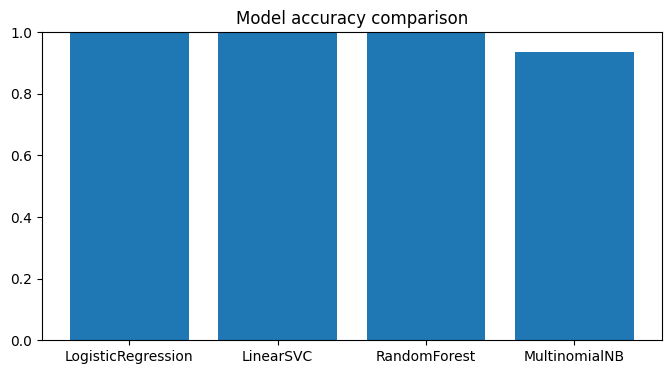

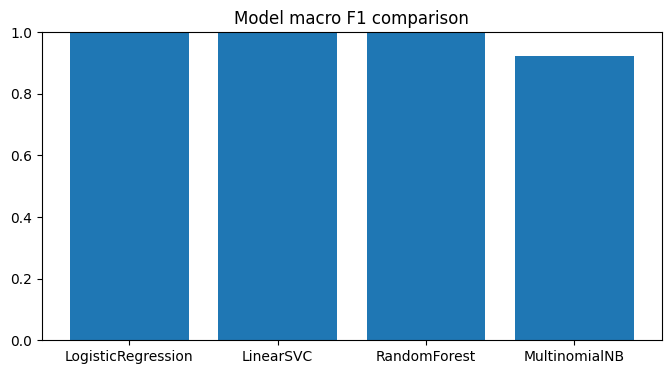

In [96]:
import matplotlib.pyplot as plt
%matplotlib inline

# Bar plots
plt.figure(figsize=(8,4))
plt.bar(res_df['model'], res_df['accuracy'])
plt.title('Model accuracy comparison')
plt.ylim(0,1)
plt.show()

plt.figure(figsize=(8,4))
plt.bar(res_df['model'], res_df['f1_macro'])
plt.title('Model macro F1 comparison')
plt.ylim(0,1)
plt.show()

# Confusion matrix for the best model
best_model = res_df.loc[0, 'model']
best_pipe = pipelines[best_model]
y_pred = best_pipe.predict(X_test)


# Multi-class ROC curve for Logistic Regression

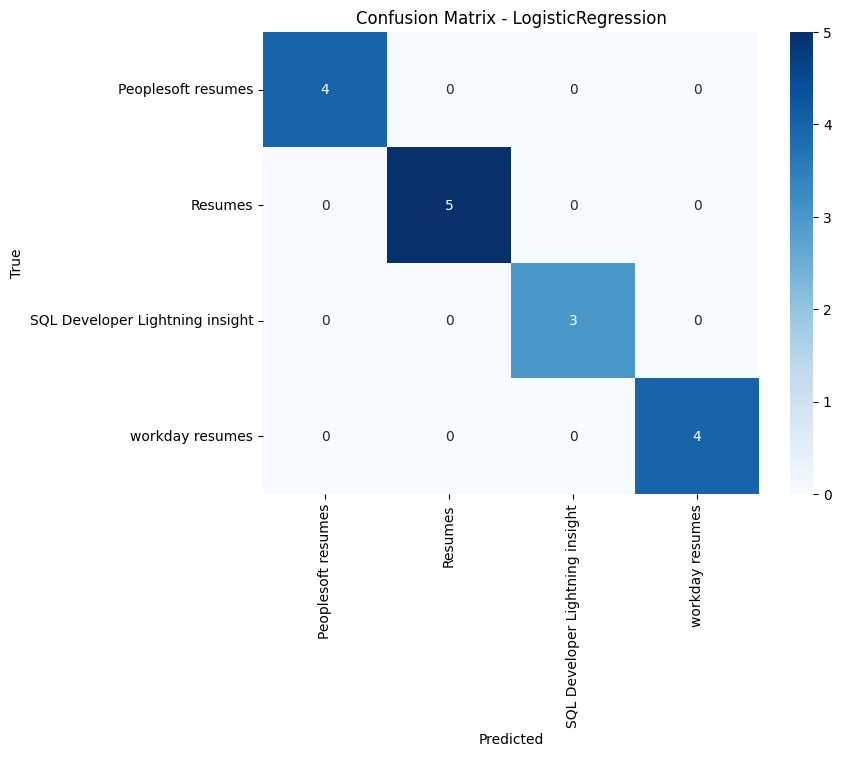

In [97]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, roc_auc_score
from itertools import cycle

# Confusion matrix for the best model
best_model = res_df.loc[0, 'model']
best_pipe = pipelines[best_model]
y_pred = best_pipe.predict(X_test)

cm = confusion_matrix(y_test, y_pred, labels=best_pipe.classes_)
fig, ax = plt.subplots(figsize=(8,6))
import seaborn as sns
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=best_pipe.classes_, yticklabels=best_pipe.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Confusion Matrix - {best_model}')
plt.show()


In [98]:
# Choose Logistic Regression pipeline
logreg_pipe = pipelines['LogisticRegression']

# Get the class labels in the order used by the model
classes = logreg_pipe.classes_
print("Classes:", classes)

Classes: ['Peoplesoft resumes' 'Resumes' 'SQL Developer Lightning insight'
 'workday resumes']


In [99]:
# Binarize labels for multi-class ROC
# Binarize the output labels for multi-class ROC
y_test_bin = label_binarize(y_test, classes=classes)
n_classes = y_test_bin.shape[1]

# Get predicted probabilities from the Logistic Regression pipeline
y_score = logreg_pipe.predict_proba(X_test)

In [100]:
# Compute ROC curve & AUC for each class + micro- & macro-average
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
# First aggregate all FPRs
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at these points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Average it and compute AUC
mean_tpr /= n_classes
fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

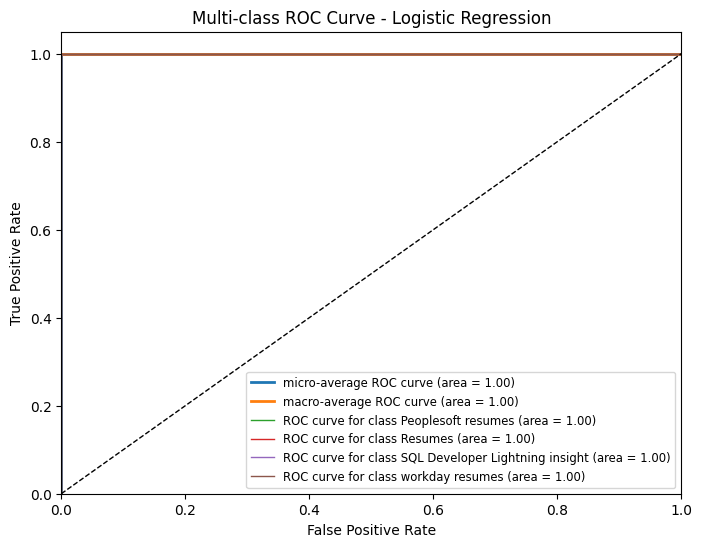

In [101]:
# Plot multi-class ROC curves (micro, macro, and per class)
plt.figure(figsize=(8,6))

# Plot micro-average ROC curve
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (area = {roc_auc['micro']:.2f})",
    linewidth=2,
)

# Plot macro-average ROC curve
plt.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (area = {roc_auc['macro']:.2f})",
    linewidth=2,
)

# Plot ROC curve for each class
for i, cls in enumerate(classes):
    plt.plot(
        fpr[i],
        tpr[i],
        label=f"ROC curve for class {cls} (area = {roc_auc[i]:.2f})",
        linewidth=1,
    )

plt.plot([0, 1], [0, 1], "k--", linewidth=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multi-class ROC Curve - Logistic Regression")
plt.legend(loc="lower right", fontsize="small")
plt.show()

In [102]:
# Overall ROC-AUC score (macro & micro)
macro_roc_auc = roc_auc_score(y_test_bin, y_score, average="macro")
micro_roc_auc = roc_auc_score(y_test_bin, y_score, average="micro")
print("Macro ROC-AUC:", macro_roc_auc)
print("Micro ROC-AUC:", micro_roc_auc)

Macro ROC-AUC: 1.0
Micro ROC-AUC: 1.0


In [103]:
import joblib

# Get the best performing model pipeline
best_model_name = res_df.loc[0, 'model']
best_pipe = pipelines[best_model_name]

# Define the filename for the pickle file
pickle_filename = 'best_model.pkl'

# Dump the model to the pickle file
joblib.dump(best_pipe, pickle_filename)

print(f"The best model ('{best_model_name}') has been saved to '{pickle_filename}'")

The best model ('LogisticRegression') has been saved to 'best_model.pkl'
